In [1]:
import os
import sys
import re
import scanpy as sc
import numpy as np
import pandas as pd

In [2]:
sys.path.append('/links/groups/treutlein/USERS/zhisong_he/Tools/')
import scripts.py_util as util

In [3]:
os.chdir("/links/groups/treutlein/USERS/zhisong_he/Work/brain_organoid_atlas/")

# Load data

In [4]:
adata = sc.read("data/phase3_final_0516/230510_08_organoids_labelled.h5ad")

In [5]:
adata.obs.keys()

Index(['assay_sc', 'assay_differentiation', 'assay_type_differentiation',
       'bio_sample', 'cell_line', 'cell_type', 'development_stage', 'disease',
       'ethnicity', 'gm', 'id', 'individual', 'organ', 'organism', 'sex',
       'state_exact', 'sample_source', 'source_doi',
       'suspension_type_original', 'tech_sample', 'treatment',
       'assay_sc_original', 'cell_line_original', 'cell_type_original',
       'development_stage_original', 'disease_original', 'ethnicity_original',
       'organ_original', 'organism_original', 'sex_original',
       'suspension_type', 'obs_names_original', 'organoid_age_days',
       'publication', 'doi', 'batch', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'leiden_pca_unintegrated_1', 'leiden_pca_unintegrated_80',
       'leiden_pca_rss_1', 'leiden_pca_rss_80',
       'snapseed_pca_unintegrated_level_1',
       'snapseed_p

In [6]:
adata.obsm.keys()

KeysView(AxisArrays with keys: X_pca_rss, X_pca_unintegrated, X_rss, X_scpoli, X_umap_pca_rss, X_umap_pca_unintegrated, X_umap_scpoli)

# Clustering based on scPoli latent space

In [ ]:
sc.pp.neighbors(adata, use_rep='X_scpoli')

In [ ]:
sc.tl.leiden(adata, resolution = 1, key_added = 'leiden_scpoli_1')

In [ ]:
sc.tl.leiden(adata, resolution = 2, key_added = 'leiden_scpoli_2')

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


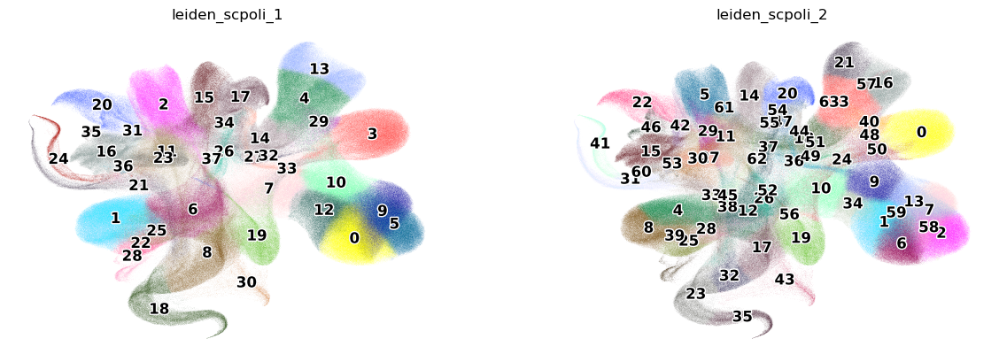

In [10]:
sc.pl.embedding(adata, basis='X_umap_scpoli', color = ['leiden_scpoli_1', 'leiden_scpoli_2'],
                add_outline=False, legend_loc='on data', legend_fontsize=12, legend_fontoutline=2, frameon=False)

In [13]:
adata.write_h5ad('data/phase3_final_0516/ZH_processed.h5ad')

# Check canonical marker expression for clusters

In [94]:
marker_genes_dict = {
    'PSC' : ['POU5F1'],
    'NC' : ['SOX10','NGFR','PAX7'],
    'NPC' : ['SOX2','VIM','NES'],
    'oRG/glioblast' : ['HOPX','BCAN','TNC'],
    'neuron' : ['DCX','STMN2','MAP2'],
    'astrocyte': ['GFAP','AQP4','SLC1A2'],
    'oligodendrocyte': ['OLIG1','OLIG2','MBP'],
    'microglia': ['AIF1'],
    'choroid plexus': ['TTR','CLIC6'],
    'endothelial': ['CLDN5','PDGFB'],
    'mesenchyme': ['DCN'],
    'pericyte': ['PDGFRB'],
    'telencephalon': ['FOXG1'],
    'cortex': ['EMX1','EOMES','NEUROD6','SLC17A7','BCL11B','SATB2'],
    'subcortex' : ['DLX2','ISL1','NKX2-1'],
    'diencephalon': ['LHX5','LHX9','RSPO3','TCF7L2'],
    'midbrain': ['OTX2'],
    'cerebellum': ['TFAP2A','CYP26A1'],
    'medulla': ['HOXA2','HOXB2'],
    'glutaminergic': ['SLC17A7','SLC17A6'],
    'GABAergic': ['SLC32A1','GAD1','GAD2'],
    'cholinergic': ['SLC18A3','CHAT'],
    'dopaminergic': ['TH','SLC6A3'],
    'cycling G2M' : ['MKI67']
}

In [15]:
adata.obsm.keys()

KeysView(AxisArrays with keys: X_pca_rss, X_pca_unintegrated, X_rss, X_scpoli, X_umap_pca_rss, X_umap_pca_unintegrated, X_umap_scpoli)

In [17]:
sc.tl.dendrogram(adata, 'leiden_scpoli_1', use_rep='X_scpoli')

categories: 0, 1, 2, etc.
var_group_labels: PSC, NC, NPC, etc.


/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


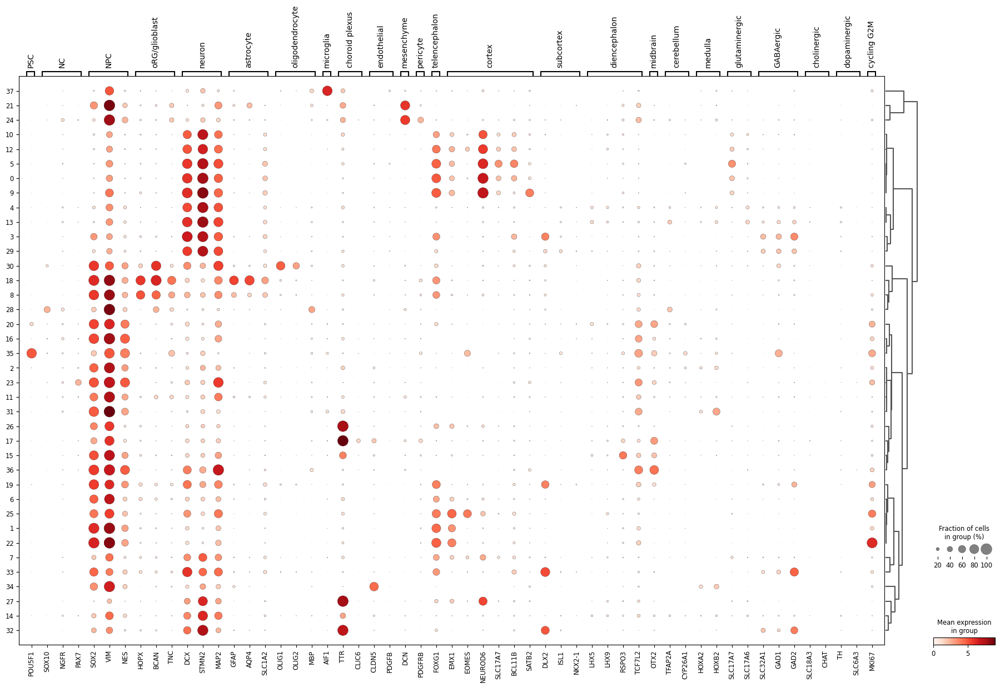

In [18]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden_scpoli_1', dendrogram=True)

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


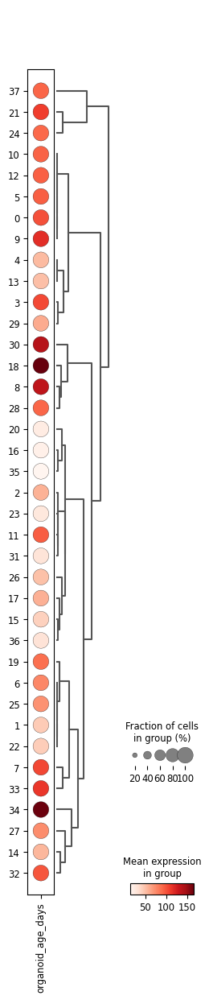

In [83]:
sc.pl.dotplot(adata, 'organoid_age_days', 'leiden_scpoli_1', dendrogram=True)

In [19]:
sc.tl.dendrogram(adata, 'leiden_scpoli_2', use_rep='X_scpoli')

categories: 0, 1, 2, etc.
var_group_labels: PSC, NC, NPC, etc.


/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


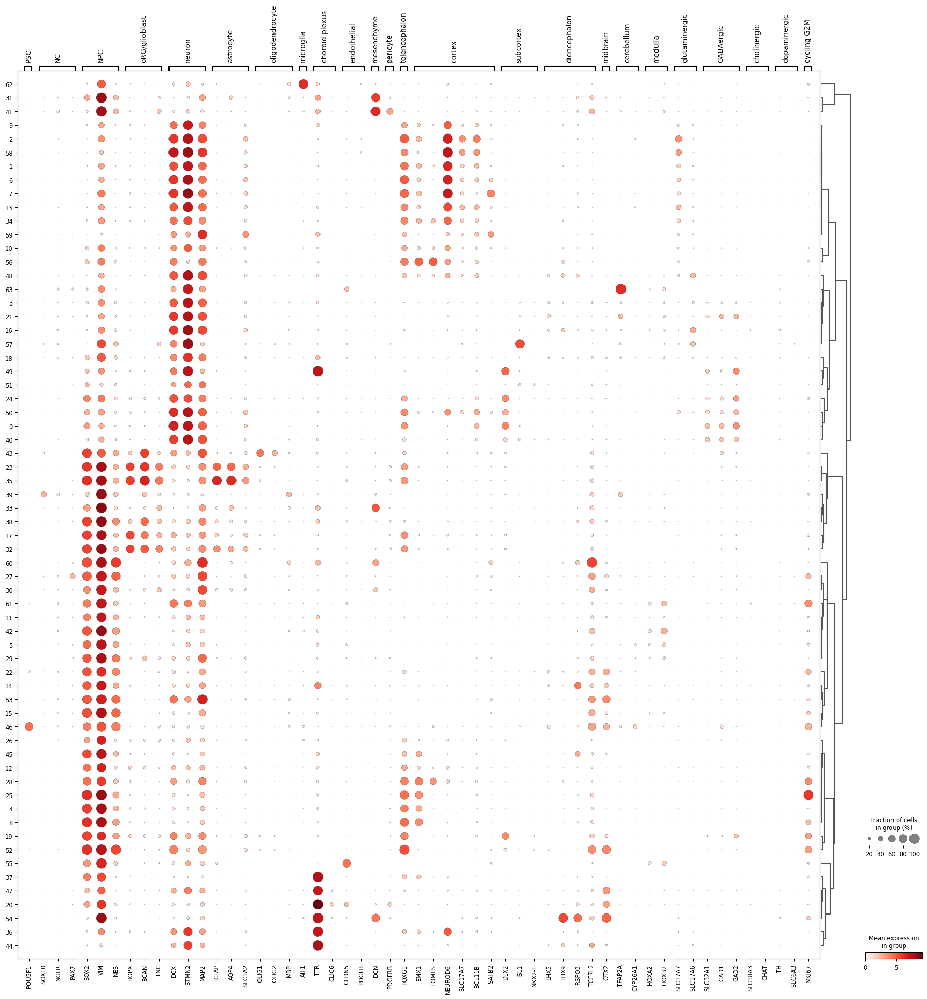

In [20]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden_scpoli_2', dendrogram=True)

# Check snapseed labels enrichment for clusters

In [25]:
adata.obs.snapseed_scpoli_level_12345.value_counts(sort = False)

astrocyte                                   24387
cerebellar_excitatory_neuron                20549
cerebellar_inhibitory_neuron                17264
cerebellar_npc                              35979
cge_inhibitory_neuron                      113282
choroid_plexus_epithelium                  117240
deeper_layer_cortical_excitatory_neuron    320285
dorsal_npc                                 216224
glioblast                                  166977
hippocampal_excitatory_neuron               21496
hippocampal_npc                             22559
hypothalamic_excitatory_neuron               6589
hypothalamic_inhibitory_neuron              20509
hypothalamic_npc                            32270
lge_inhibitory_neuron                       30857
medullary_excitatory_neuron                 12984
medullary_inhibitory_neuron                 24977
medullary_npc                               65013
mesencephalic_excitatory_neuron             11637
mesencephalic_inhibitory_neuron              3130


In [26]:
region_snapseed_labs = {'astrocyte' : 'unspecific',
                        'cerebellar_excitatory_neuron' : 'hindbrain',
                        'cerebellar_inhibitory_neuron' : 'hindbrain',
                        'cerebellar_npc' : 'hindbrain',
                        'cge_inhibitory_neuron' : 'subcortex',
                        'choroid_plexus_epithelium' : 'unspecific',
                        'deeper_layer_cortical_excitatory_neuron' : 'cortex',
                        'dorsal_npc' : 'cortex',
                        'glioblast' : 'unspecific',
                        'hippocampal_excitatory_neuron' : 'cortex',
                        'hippocampal_npc' : 'cortex',
                        'hypothalamic_excitatory_neuron' : 'diencephalon',
                        'hypothalamic_inhibitory_neuron' : 'diencephalon',
                        'hypothalamic_npc' : 'diencephalon',
                        'lge_inhibitory_neuron' : 'subcortex',
                        'medullary_excitatory_neuron' : 'hindbrain',
                        'medullary_inhibitory_neuron' : 'hindbrain',
                        'medullary_npc' : 'hindbrain',
                        'mesencephalic_excitatory_neuron' : 'midbrain',
                        'mesencephalic_inhibitory_neuron' : 'midbrain',
                        'mesencephalic_npc' : 'midbrain',
                        'mesenchymal_cell' : 'unspecific',
                        'mge_inhibitory_neuron' : 'subcortex',
                        'microglia' : 'unspecific',
                        'oligodendrocyte_precursor_cell' : 'unspecific',
                        'pons_excitatory_neuron' : 'hindbrain',
                        'pons_inhibitory_neuron' : 'hindbrain',
                        'pons_npc' : 'hindbrain',
                        'thalamic_excitatory_neuron' : 'diencephalon',
                        'thalamic_inhibitory_neuron' : 'diencephalon',
                        'thalamic_npc' : 'diencephalon',
                        'upper_layer_cortical_excitatory_neuron' : 'cortex',
                        'vascular_endothelial_cell' : 'unspecific',
                        'ventral_npc' : 'subcortex'}

In [27]:
adata.obs['snapseed_scpoli_region'] = np.array([region_snapseed_labs[x] for x in adata.obs.snapseed_scpoli_level_12345])

In [29]:
subregion_snapseed_labs = {'astrocyte' : 'unspecific',
                           'cerebellar_excitatory_neuron' : 'cerebellum',
                           'cerebellar_inhibitory_neuron' : 'cerebellum',
                           'cerebellar_npc' : 'cerebellum',
                           'cge_inhibitory_neuron' : 'subcortex',
                           'choroid_plexus_epithelium' : 'unspecific',
                           'deeper_layer_cortical_excitatory_neuron' : 'cortex',
                           'dorsal_npc' : 'cortex',
                           'glioblast' : 'unspecific',
                           'hippocampal_excitatory_neuron' : 'cortex',
                           'hippocampal_npc' : 'cortex',
                           'hypothalamic_excitatory_neuron' : 'hypothalamus',
                           'hypothalamic_inhibitory_neuron' : 'hypothalamus',
                           'hypothalamic_npc' : 'hypothalamus',
                           'lge_inhibitory_neuron' : 'subcortex',
                           'medullary_excitatory_neuron' : 'medulla',
                           'medullary_inhibitory_neuron' : 'medulla',
                           'medullary_npc' : 'medulla',
                           'mesencephalic_excitatory_neuron' : 'midbrain',
                           'mesencephalic_inhibitory_neuron' : 'midbrain',
                           'mesencephalic_npc' : 'midbrain',
                           'mesenchymal_cell' : 'unspecific',
                           'mge_inhibitory_neuron' : 'subcortex',
                           'microglia' : 'unspecific',
                           'oligodendrocyte_precursor_cell' : 'unspecific',
                           'pons_excitatory_neuron' : 'pons',
                           'pons_inhibitory_neuron' : 'pons',
                           'pons_npc' : 'pons',
                           'thalamic_excitatory_neuron' : 'thalamus',
                           'thalamic_inhibitory_neuron' : 'thalamus',
                           'thalamic_npc' : 'thalamus',
                           'upper_layer_cortical_excitatory_neuron' : 'cortex',
                           'vascular_endothelial_cell' : 'unspecific',
                           'ventral_npc' : 'subcortex'}

In [30]:
adata.obs['snapseed_scpoli_subregion'] = np.array([subregion_snapseed_labs[x] for x in adata.obs.snapseed_scpoli_level_12345])

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


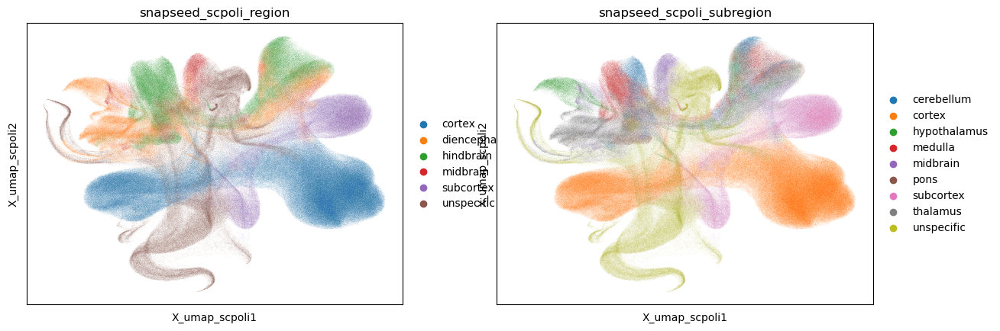

In [32]:
sc.pl.embedding(adata, basis='X_umap_scpoli', color = ['snapseed_scpoli_region','snapseed_scpoli_subregion'])

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<AxesSubplot: title={'center': 'snapseed_scpoli_subregion'}, xlabel='X_umap_scpoli1', ylabel='X_umap_scpoli2'>

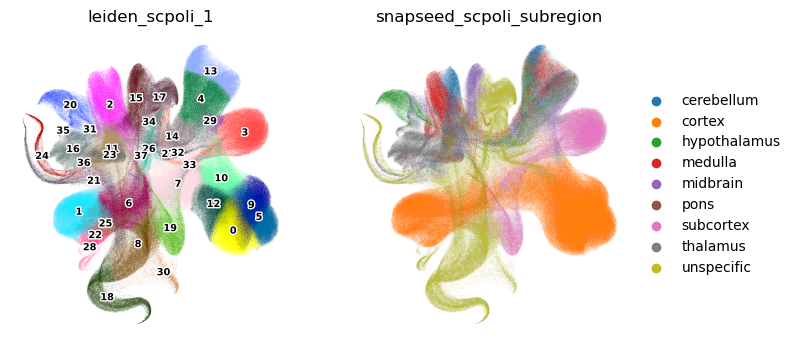

In [78]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,2, figsize=(8, 4))
sc.pl.embedding(adata, ax = ax[0], basis='X_umap_scpoli', color = ['leiden_scpoli_1'], add_outline=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2, frameon=False, show=False)
sc.pl.embedding(adata, ax = ax[1], basis='X_umap_scpoli', color = ['snapseed_scpoli_subregion'], show=False, frameon = False, add_outline=False)

In [49]:
freq_celltype_cl1 = pd.concat([ adata.obs.snapseed_scpoli_level_1[adata.obs.leiden_scpoli_1 == x].value_counts(sort = False) for x in adata.obs.leiden_scpoli_1.unique().sort_values() ], axis=1).set_axis(adata.obs.leiden_scpoli_1.unique().sort_values(), axis=1)
freq_celltype_cl1

,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
astrocyte,0,0,0,0,0,0,0,0,345,0,...,0,0,0,0,0,0,0,0,0,0
choroid_plexus_epithelium,0,0,7814,0,0,0,1724,2119,13,0,...,4,0,0,0,4095,0,0,0,0,0
mesenchymal_cell,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
microglia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,96
neural_progenitor_cell,0,113265,101915,0,0,0,88079,18156,79138,0,...,9767,0,3327,6077,2,19,1023,2187,1672,0
neuron,131415,0,68,107624,100623,99404,126,60297,10,74754,...,0,9291,552,0,728,4363,0,0,7,0
oligodendrocyte_lineage,0,0,0,0,0,0,0,0,0,0,...,0,0,4446,0,0,0,0,0,0,0
vascular_endothelial_cell,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1428,0,0,0


In [70]:
freq_celltype2_cl1 = pd.concat([ adata.obs.snapseed_scpoli_level_12[adata.obs.leiden_scpoli_1 == x].value_counts(sort = False) for x in adata.obs.leiden_scpoli_1.unique().sort_values() ], axis=1).set_axis(adata.obs.leiden_scpoli_1.unique().sort_values(), axis=1)
freq_celltype2_cl1

,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
astrocyte,0,0,0,0,0,0,0,0,345,0,...,0,0,0,0,0,0,0,0,0,0
choroid_plexus_epithelium,0,0,7814,0,0,0,1724,2119,13,0,...,4,0,0,0,4095,0,0,0,0,0
diencephalic_npc,0,0,8713,0,0,0,304,457,25,0,...,1039,0,0,1544,0,0,0,2179,7,0
excitatory_neuron,131415,0,55,26,60569,99404,126,45299,0,74754,...,0,2,0,0,6,0,0,0,7,0
glioblast,0,1,318,0,0,0,9820,1950,77363,0,...,8356,0,3323,1,0,0,0,0,0,0
inhibitory_neuron,0,0,13,107598,40054,0,0,14998,10,0,...,0,9289,552,0,722,4363,0,0,0,0
mesencephalic_npc,0,0,3646,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,8,1665,0
mesenchymal_cell,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
microglia,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,96
oligodendrocyte_precursor_cell,0,0,0,0,0,0,0,0,0,0,...,0,0,4446,0,0,0,0,0,0,0


In [61]:
freq_region_cl1 = pd.concat([ adata.obs.snapseed_scpoli_region[adata.obs.leiden_scpoli_1 == x].value_counts(sort = False) for x in adata.obs.leiden_scpoli_1.unique().sort_values() ], axis=1).set_axis(adata.obs.leiden_scpoli_1.unique().sort_values(), axis=1)
freq_region_cl1 = freq_region_cl1.loc[['cortex','subcortex','diencephalon','midbrain','hindbrain','unspecific'],:]
freq_region_cl1

,0,1,2,3,4,5,6,7,8,9,...,28,29,30,31,32,33,34,35,36,37
cortex,131415,113128,1491,26,1408,99404,74171,59119,195,74754,...,2,0,0,0,5,0,0,0,0,0
subcortex,0,136,2,106880,2423,0,3910,15258,1565,0,...,0,3960,490,0,707,4382,0,0,0,0
diencephalon,0,0,8781,704,40627,0,304,2099,25,0,...,1039,5168,0,1544,15,0,0,2179,14,0
midbrain,0,0,3646,0,10516,0,0,0,0,0,...,0,0,0,0,0,0,0,8,1665,0
hindbrain,0,0,87745,14,45649,0,0,27,0,0,...,370,163,66,4532,3,0,1023,0,0,0
unspecific,0,1,8132,0,0,0,11544,4069,77721,0,...,8360,0,7769,1,4095,0,1428,0,0,96


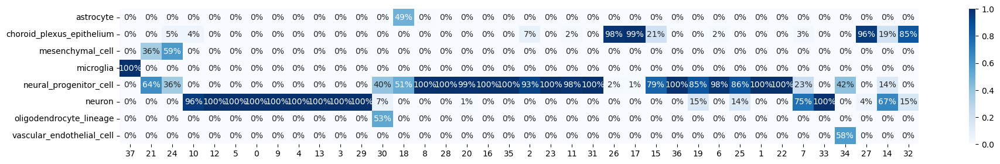

In [67]:
import seaborn as sns
from matplotlib.pyplot import rc_context

mat = freq_celltype_cl1.loc[:,adata.uns['dendrogram_leiden_scpoli_1']['categories_ordered']].apply(lambda x: x / np.sum(x), axis=0)
with rc_context({'figure.figsize': (22, 3)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

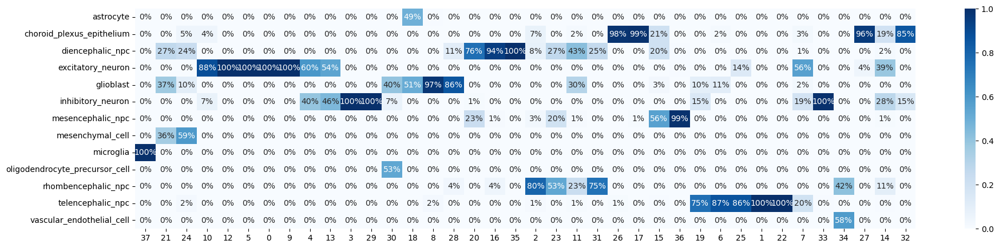

In [72]:
mat = freq_celltype2_cl1.loc[:,adata.uns['dendrogram_leiden_scpoli_1']['categories_ordered']].apply(lambda x: x / np.sum(x), axis=0)
with rc_context({'figure.figsize': (22, 5)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

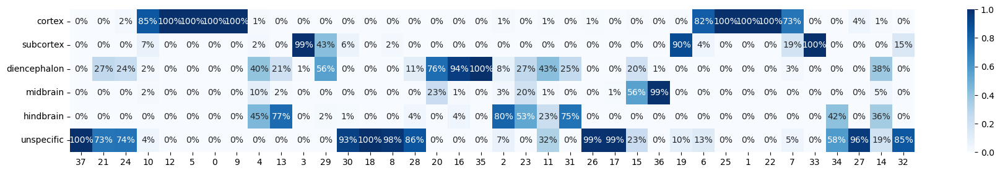

In [68]:
mat = freq_region_cl1.loc[:,adata.uns['dendrogram_leiden_scpoli_1']['categories_ordered']].apply(lambda x: x / np.sum(x), axis=0)
with rc_context({'figure.figsize': (22, 3)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

# Assign manual annotation

In [87]:
ct_annot_cl1 = dict(zip(adata.uns['dendrogram_leiden_scpoli_1']['categories_ordered'],
                        ['microglia',
                         'mesenchyme',
                         'mesenchyme',
                         'cortical early ExN',
                         'cortical early ExN',
                         'cortical dL ExN',
                         'cortical ExN',
                         'cortical uL ExN',
                         'non-telen. early N',
                         'non-telen. N',
                         'subcortical InN',
                         'non-telen. InN',
                         'OPC',
                         'astrocyte',
                         'glioblast',
                         'neural crest derivatives',
                         'neuroepithelium',
                         'neuroepithelium',
                         'PSC',
                         'hindbrain NPC',
                         'dien./mesen. NPC',
                         'dien./mesen. NPC',
                         'hindbrain NPC',
                         'CP',
                         'CP',
                         'dien. NPC (TTR+)',
                         'dien./mesen. NPC',
                         'subcortical NPC',
                         'cortical NPC',
                         'cortical IP',
                         'cortical NPC',
                         'cortical NPC (G2M)',
                         'cortical early ExN',
                         'subcortical InN',
                         'endothelial cell',
                         'CP',
                         'non-telen. early N',
                         'non-telen. InN (TTR+)']))
adata.obs['manual_annot_ct_fine'] = np.array([ct_annot_cl1[x] for x in adata.obs['leiden_scpoli_1']])

In [88]:
ct_annot_cl1 = dict(zip(adata.uns['dendrogram_leiden_scpoli_1']['categories_ordered'],
                        ['microglia',
                         'mesenchyme',
                         'mesenchyme',
                         'cortical ExN',
                         'cortical ExN',
                         'cortical ExN',
                         'cortical ExN',
                         'cortical ExN',
                         'non-telen. N',
                         'non-telen. N',
                         'subcortical InN',
                         'non-telen. N',
                         'OPC',
                         'astrocyte',
                         'glioblast',
                         'neural crest derivatives',
                         'neuroepithelium',
                         'neuroepithelium',
                         'PSC',
                         'hindbrain NPC',
                         'dien./mesen. NPC',
                         'dien./mesen. NPC',
                         'hindbrain NPC',
                         'CP',
                         'CP',
                         'dien./mesen. NPC',
                         'dien./mesen. NPC',
                         'subcortical NPC',
                         'cortical NPC',
                         'cortical IP',
                         'cortical NPC',
                         'cortical NPC',
                         'cortical ExN',
                         'subcortical InN',
                         'endothelial cell',
                         'CP',
                         'non-telen. N',
                         'non-telen. N']))
adata.obs['manual_annot_ct'] = np.array([ct_annot_cl1[x] for x in adata.obs['leiden_scpoli_1']])

In [98]:
reg_annot_cl1 = dict(zip(adata.uns['dendrogram_leiden_scpoli_1']['categories_ordered'],
                        ['unspecific',
                         'unspecific',
                         'unspecific',
                         'cortex',
                         'cortex',
                         'cortex',
                         'cortex',
                         'cortex',
                         'non-telen.',
                         'non-telen.',
                         'subcortex',
                         'non-telen.',
                         'unspecific',
                         'unspecific',
                         'unspecific',
                         'unspecific',
                         'unspecific',
                         'unspecific',
                         'unspecific',
                         'non-telen.',
                         'non-telen.',
                         'non-telen.',
                         'non-telen.',
                         'unspecific',
                         'unspecific',
                         'non-telen.',
                         'non-telen.',
                         'subcortex',
                         'cortex',
                         'cortex',
                         'cortex',
                         'cortex',
                         'cortex',
                         'subcortex',
                         'unspecific',
                         'unspecific',
                         'non-telen.',
                         'non-telen.']))
adata.obs['manual_annot_region'] = np.array([reg_annot_cl1[x] for x in adata.obs['leiden_scpoli_1']])

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


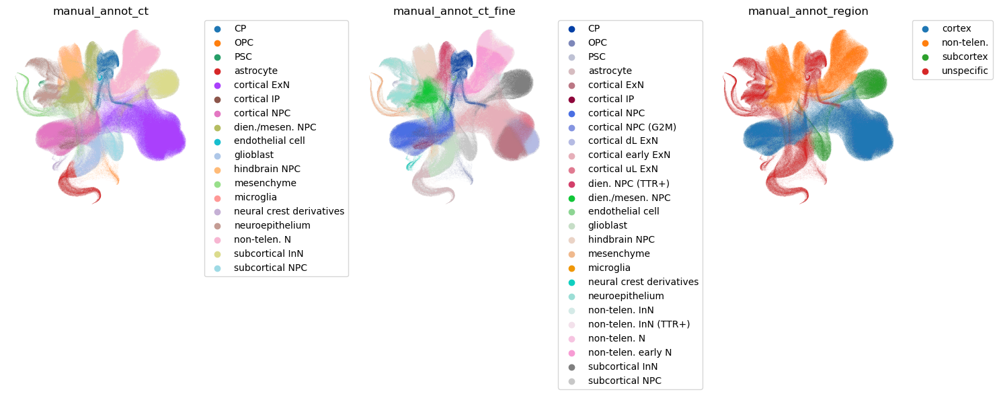

In [99]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,3, figsize=(15, 5))
sc.pl.embedding(adata, ax=ax[0], basis='X_umap_scpoli', color = ['manual_annot_ct'], show=False, frameon = False, add_outline=False)
sc.pl.embedding(adata, ax=ax[1], basis='X_umap_scpoli', color = ['manual_annot_ct_fine'], show=False, frameon = False, add_outline=False)
sc.pl.embedding(adata, ax=ax[2], basis='X_umap_scpoli', color = ['manual_annot_region'], show=False, frameon = False, add_outline=False)
ax[0].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[1].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[2].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()

# Save the annotation

## Incorporate the aggrecell-based scPoli results

In [100]:
emb_scpoli_aggr_1 = np.load('data/phase3_final_0516/emb_scpoli_aggr_level1.npy')
emb_scpoli_aggr_123 = np.load('data/phase3_final_0516/emb_scpoli_aggr_level123.npy')
emb_umap_scpoli_aggr_1 = np.load('data/phase3_final_0516/emb_umap_scpoli_aggr_level1.npy')
emb_umap_scpoli_aggr_123 = np.load('data/phase3_final_0516/emb_umap_scpoli_aggr_level123.npy')
adata.obsm['X_scpoli_aggr_1'] = emb_scpoli_aggr_1
adata.obsm['X_scpoli_aggr_123'] = emb_scpoli_aggr_123
adata.obsm['X_umap_scpoli_aggr_1'] = emb_umap_scpoli_aggr_1
adata.obsm['X_umap_scpoli_aggr_123'] = emb_umap_scpoli_aggr_123

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


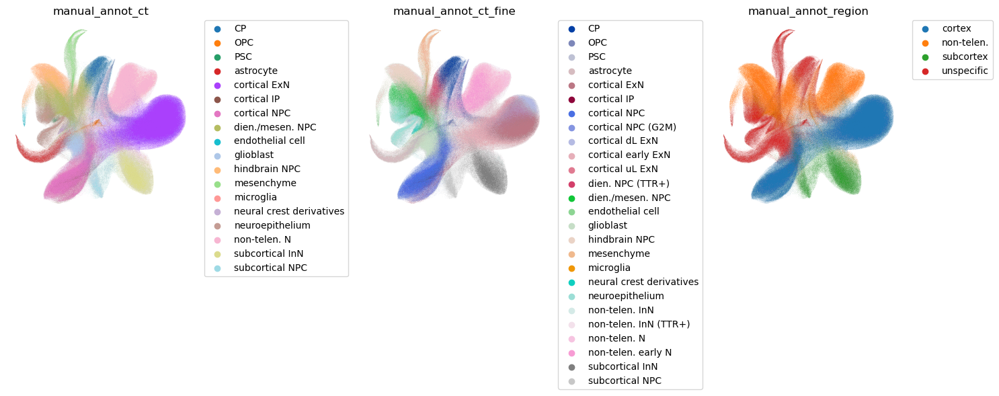

In [101]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,3, figsize=(15, 5))
sc.pl.embedding(adata, ax=ax[0], basis='X_umap_scpoli_aggr_123', color = ['manual_annot_ct'], show=False, frameon = False, add_outline=False)
sc.pl.embedding(adata, ax=ax[1], basis='X_umap_scpoli_aggr_123', color = ['manual_annot_ct_fine'], show=False, frameon = False, add_outline=False)
sc.pl.embedding(adata, ax=ax[2], basis='X_umap_scpoli_aggr_123', color = ['manual_annot_region'], show=False, frameon = False, add_outline=False)
ax[0].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[1].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[2].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


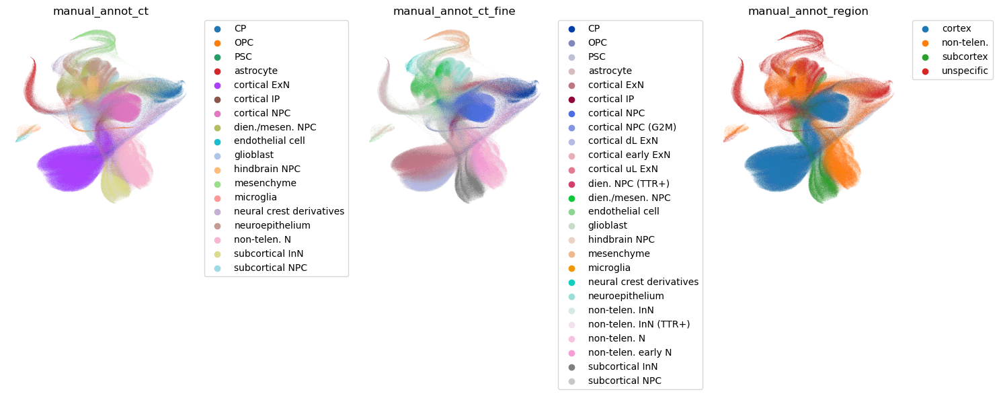

In [102]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,3, figsize=(15, 5))
sc.pl.embedding(adata, ax=ax[0], basis='X_umap_scpoli_aggr_1', color = ['manual_annot_ct'], show=False, frameon = False, add_outline=False)
sc.pl.embedding(adata, ax=ax[1], basis='X_umap_scpoli_aggr_1', color = ['manual_annot_ct_fine'], show=False, frameon = False, add_outline=False)
sc.pl.embedding(adata, ax=ax[2], basis='X_umap_scpoli_aggr_1', color = ['manual_annot_region'], show=False, frameon = False, add_outline=False)
ax[0].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[1].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[2].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()

## Save the complete data set

In [103]:
adata.write_h5ad('data/phase3_final_0516/ZH_processed.h5ad')

# Generate a subset of non-telencephalic neurons for more heterogeneity

In [104]:
adata_nontel = adata[adata.obs.manual_annot_ct == 'non-telen. N',:]

In [106]:
[adata.shape, adata_nontel.shape]

[(1770578, 36842), (226566, 36842)]

## Generate UMAP based on the global scPoli representation

In [74]:
sc.pp.neighbors(adata_nontel, use_rep='X_scpoli', n_neighbors=20)

In [112]:
sc.tl.umap(adata_nontel)

In [115]:
adata_nontel.obsm['X_umap_scpoli'] = adata_nontel.obsm['X_umap'].copy()

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


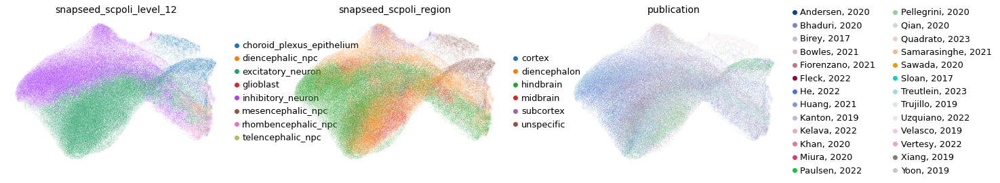

In [53]:
sc.pl.embedding(adata_nontel, basis="X_umap_scpoli", color=['snapseed_scpoli_level_12', 'snapseed_scpoli_region', 'publication'], frameon = False, add_outline=False)

In [116]:
adata_nontel.obsm.keys()

KeysView(AxisArrays with keys: X_pca_rss, X_pca_unintegrated, X_rss, X_scpoli, X_umap_pca_rss, X_umap_pca_unintegrated, X_umap_scpoli, X_scpoli_aggr_1, X_scpoli_aggr_123, X_umap_scpoli_aggr_1, X_umap_scpoli_aggr_123, X_umap)

In [75]:
sc.tl.leiden(adata_nontel, resolution=1, key_added='leiden_1_scpoli_global')

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


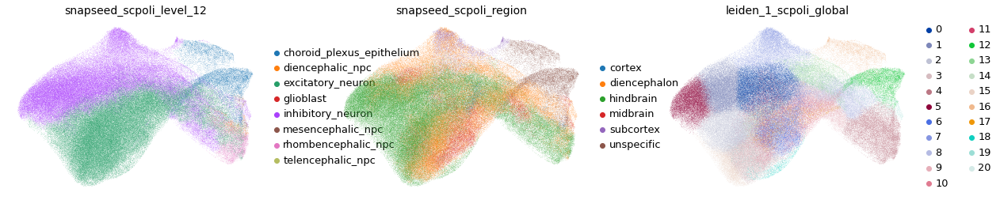

<Figure size 432x288 with 0 Axes>

In [78]:
import matplotlib.pyplot as plt
sc.pl.embedding(adata_nontel, basis="X_umap_scpoli", color=['snapseed_scpoli_level_12', 'snapseed_scpoli_region', 'leiden_1_scpoli_global'], frameon = False, add_outline=False)
plt.tight_layout()

In [76]:
adata_nontel.write_h5ad("data/phase3_final_0516/ZH_processed_nontelen_neurons.h5ad")

## Generate UMAP based on the global aggrecell-based scPoli (level-1) representation

In [117]:
sc.pp.neighbors(adata_nontel, use_rep='X_scpoli_aggr_1', n_neighbors=20)

In [118]:
sc.tl.umap(adata_nontel)

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_reticulate/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


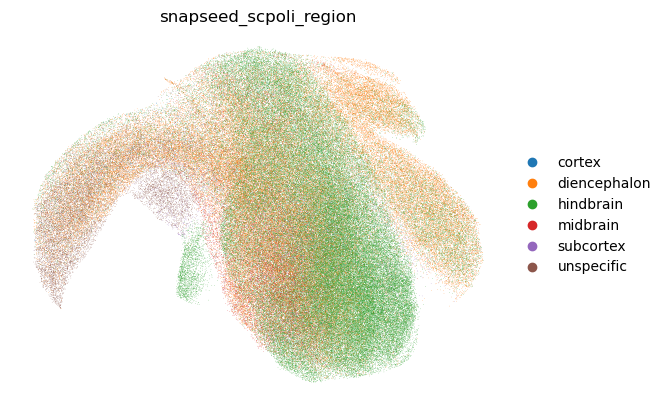

In [119]:
sc.pl.umap(adata_nontel, color='snapseed_scpoli_region', frameon = False, add_outline=False)

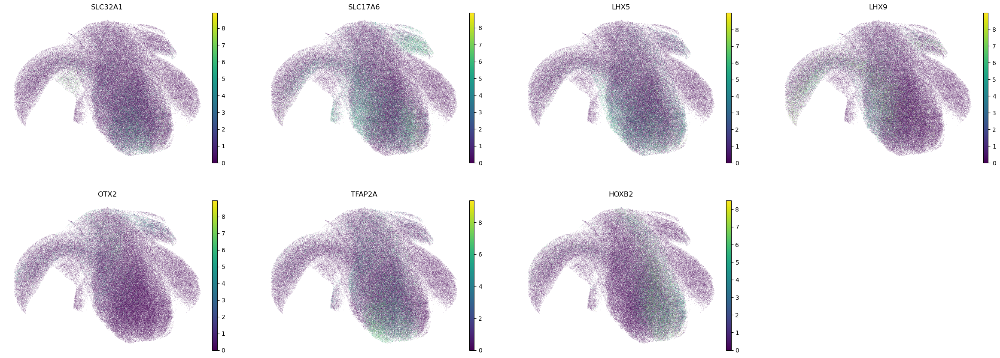

In [120]:
sc.pl.umap(adata_nontel, color=['SLC32A1','SLC17A6','LHX5','LHX9','OTX2','TFAP2A','HOXB2'], frameon = False, add_outline=False)

In [124]:
adata_nontel.write_h5ad("data/phase3_final_0516/ZH_processed_nontelen_neurons.h5ad")

## Rerun scPoli on the subset

In [4]:
adata_nontel = sc.read('data/phase3_final_0516/ZH_processed_nontelen_neurons.h5ad')

In [5]:
adata_nontel.var_names_make_unique()

In [12]:
adata_nontel.uns['log1p']['base'] = None
sc.pp.highly_variable_genes(adata_nontel, n_top_genes = 2000, flavor='seurat', batch_key = 'publication')

In [13]:
adata_nontel_hvg = adata_nontel[:,adata_nontel.var.highly_variable]

In [14]:
adata_nontel_hvg.shape

(226566, 2000)

In [16]:
from scarches.models.scpoli import scPoli

 captum (see https://github.com/pytorch/captum).
INFO:lightning_fabric.utilities.seed:Global seed set to 0
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [25]:
scpoli_model_123 = scPoli(
    adata=adata_nontel_hvg,
    unknown_ct_names=["unknown"],
    condition_key="batch",
    cell_type_keys=["snapseed_pca_unintegrated_level_1","snapseed_pca_rss_level_12","snapseed_pca_rss_level_123"],
    embedding_dim=10,
    hidden_layer_sizes=[512]
)

Embedding dictionary:
 	Num conditions: 339
 	Embedding dim: 10
Encoder Architecture:
	Input Layer in, out and cond: 2000 512 10
	Mean/Var Layer in/out: 512 10
Decoder Architecture:
	First Layer in, out and cond:  10 512 10
	Output Layer in/out:  512 2000 



In [26]:
early_stopping_kwargs = {
    "early_stopping_metric": "val_prototype_loss",
    "mode": "min",
    "threshold": 0,
    "patience": 20,
    "reduce_lr": True,
    "lr_patience": 13,
    "lr_factor": 0.1,
}

In [27]:
scpoli_model_123.train(
    n_epochs=10,
    pretraining_epochs=8,
    early_stopping_kwargs=early_stopping_kwargs,
    eta=10,
    alpha_epoch_anneal=100
)

 |████████████████----| 80.0%  - val_loss: 1167.6059625486 - val_cvae_loss: 1167.6059625486
Initializing unlabeled prototypes with Leiden-Clustering with an unknown number of clusters.
Leiden Clustering succesful. Found 48 clusters.
 |████████████████████| 100.0%  - val_loss: 1186.5095656228 - val_cvae_loss: 1177.6965607896 - val_prototype_loss: 8.8130117702 - val_unlabeled_loss: 0.0000000000 - val_labeled_loss: 0.8813011778


In [28]:
import pickle
with open('data/phase3_final_0516/model_scpoli_level123_nontelen_neurons.pickle', 'wb') as file:
    pickle.dump(scpoli_model_123, file)

In [29]:
data_nontel_latent_123 = scpoli_model_123.get_latent(
    adata_nontel_hvg.X, 
    adata_nontel_hvg.obs["batch"].values,
    mean=True
)
adata_nontel.obsm['X_scpoli_level123'] = data_nontel_latent_123

In [57]:
sc.pp.neighbors(adata_nontel, use_rep = "X_scpoli_level123", n_neighbors=20)

In [58]:
sc.tl.umap(adata_nontel)

In [59]:
adata_nontel.obsm['X_umap_scpoli_123'] = adata_nontel.obsm['X_umap'].copy()

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


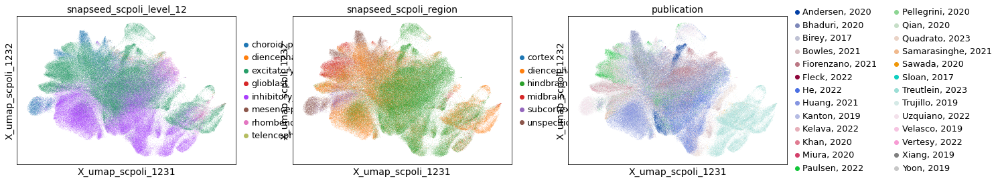

In [60]:
sc.pl.embedding(adata_nontel, basis='X_umap_scpoli_123', color=['snapseed_scpoli_level_12', 'snapseed_scpoli_region', 'publication'])

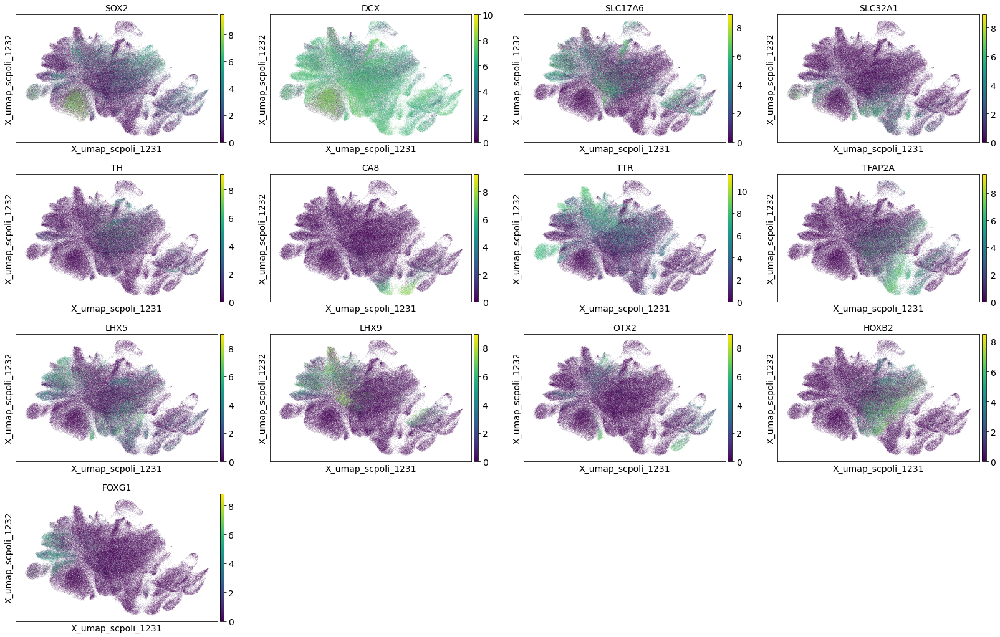

In [61]:
sc.pl.embedding(adata_nontel, basis='X_umap_scpoli_123', color=['SOX2', 'DCX', 'SLC17A6', 'SLC32A1', 'TH', 'CA8', 'TTR', 'TFAP2A', 'LHX5', 'LHX9', 'OTX2', 'HOXB2', 'FOXG1'])

In [37]:
sc.tl.leiden(adata_nontel, resolution=1)

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


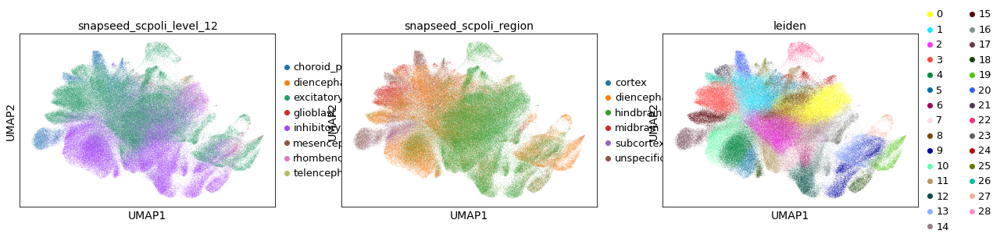

In [38]:
sc.pl.embedding(adata_nontel, basis='X_umap_scpoli_123', color=['snapseed_scpoli_level_12', 'snapseed_scpoli_region', 'leiden'])

In [39]:
adata_nontel.write_h5ad("data/phase3_final_0516/ZH_processed_nontelen_neurons.h5ad")

## harmony on top of scPoli to integrate the midbrain organoid data into the rest

### run harmony and do clustering

In [ ]:
adata_nontel = sc.read('data/phase3_final_0516/ZH_processed_nontelen_neurons.h5ad')

In [44]:
adata_nontel.obs['is_Treutlein2023'] = (adata_nontel.obs['publication'] == "Treutlein, 2023").astype('category')

In [48]:
sc.external.pp.harmony_integrate(adata_nontel, key = "is_Treutlein2023", basis="X_scpoli_level123")

2023-05-24 12:47:40,296 - harmonypy - INFO - Iteration 1 of 10
INFO:harmonypy:Iteration 1 of 10
2023-05-24 12:48:35,099 - harmonypy - INFO - Iteration 2 of 10
INFO:harmonypy:Iteration 2 of 10
2023-05-24 12:48:56,548 - harmonypy - INFO - Iteration 3 of 10
INFO:harmonypy:Iteration 3 of 10
2023-05-24 12:49:17,163 - harmonypy - INFO - Converged after 3 iterations
INFO:harmonypy:Converged after 3 iterations


In [83]:
sc.pp.neighbors(adata_nontel, use_rep = "X_pca_harmony", n_neighbors=20)

In [50]:
sc.tl.umap(adata_nontel)

In [54]:
adata_nontel.obsm['X_umap_scpoli_harmony'] = adata_nontel.obsm['X_umap'].copy()

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


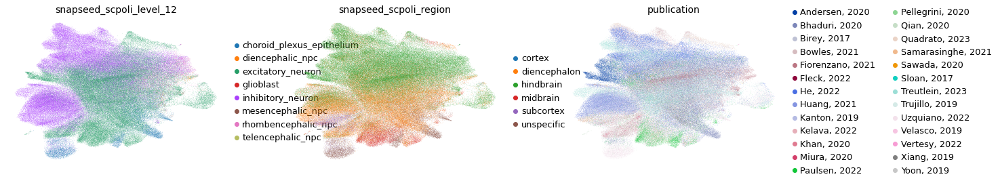

In [55]:
sc.pl.embedding(adata_nontel, basis='X_umap_scpoli_harmony', color=['snapseed_scpoli_level_12', 'snapseed_scpoli_region', 'publication'], frameon = False, add_outline=False)

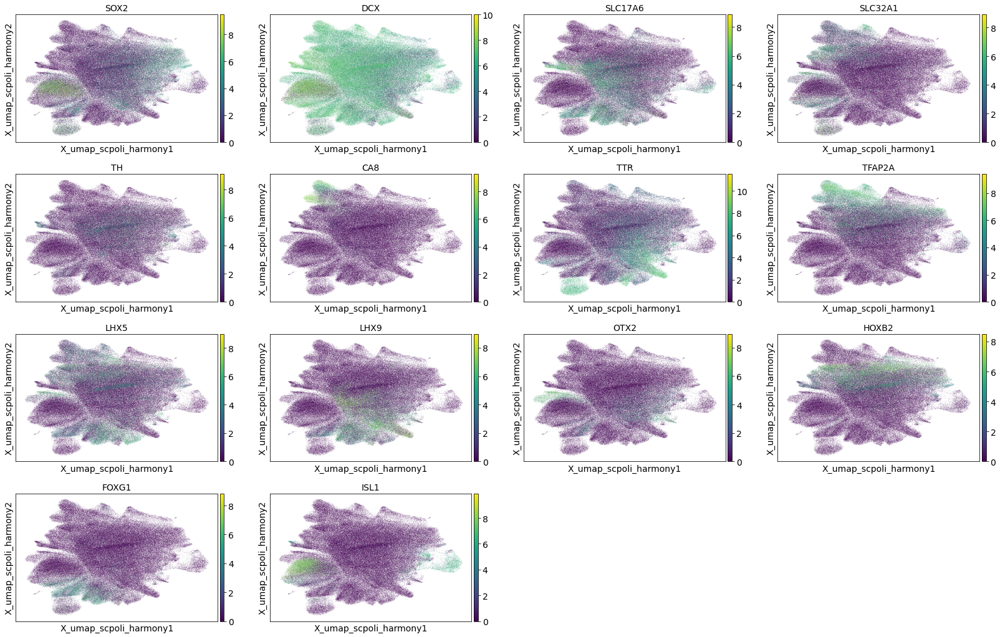

In [145]:
sc.pl.embedding(adata_nontel, basis='X_umap_scpoli_harmony', color=['SOX2', 'DCX', 'SLC17A6', 'SLC32A1', 'TH', 'CA8', 'TTR', 'TFAP2A', 'LHX5', 'LHX9', 'OTX2', 'HOXB2', 'FOXG1','ISL1'])

In [63]:
sc.tl.leiden(adata_nontel, resolution=1)

In [84]:
sc.tl.leiden(adata_nontel, resolution=0.5, key_added="leiden_0.5_scpoli_harmony")

In [108]:
sc.tl.leiden(adata_nontel, resolution=1.5, key_added="leiden_1.5_scpoli_harmony")

### check the umap and compare with the global scPoli one

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/g

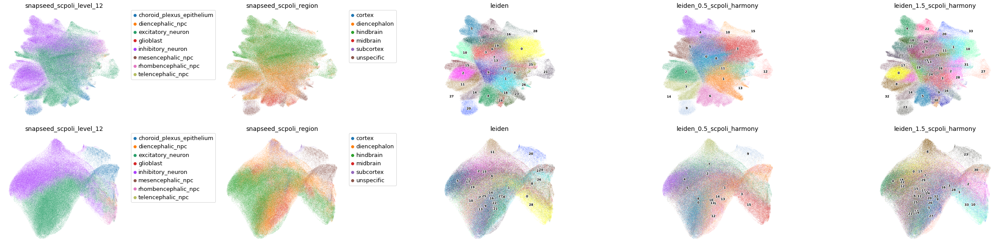

In [110]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(2,5,figsize=(32,8))
sc.pl.embedding(adata_nontel, ax = ax[0,0], basis='X_umap_scpoli_harmony', color=['snapseed_scpoli_level_12'], add_outline=False, frameon = False, show=False)
sc.pl.embedding(adata_nontel, ax = ax[0,1], basis='X_umap_scpoli_harmony', color=['snapseed_scpoli_region'], add_outline=False, frameon = False, show=False)
sc.pl.embedding(adata_nontel, ax = ax[0,2], basis='X_umap_scpoli_harmony', color=['leiden'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
sc.pl.embedding(adata_nontel, ax = ax[0,3], basis='X_umap_scpoli_harmony', color=['leiden_0.5_scpoli_harmony'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
sc.pl.embedding(adata_nontel, ax = ax[0,4], basis='X_umap_scpoli_harmony', color=['leiden_1.5_scpoli_harmony'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
ax[0,0].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[0,1].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sc.pl.embedding(adata_nontel, ax = ax[1,0], basis='X_umap_scpoli', color=['snapseed_scpoli_level_12'], add_outline=False, frameon = False, show=False)
sc.pl.embedding(adata_nontel, ax = ax[1,1], basis='X_umap_scpoli', color=['snapseed_scpoli_region'], add_outline=False, frameon = False, show=False)
sc.pl.embedding(adata_nontel, ax = ax[1,2], basis='X_umap_scpoli', color=['leiden'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
sc.pl.embedding(adata_nontel, ax = ax[1,3], basis='X_umap_scpoli', color=['leiden_0.5_scpoli_harmony'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
sc.pl.embedding(adata_nontel, ax = ax[1,4], basis='X_umap_scpoli', color=['leiden_1.5_scpoli_harmony'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
ax[1,0].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[1,1].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()

In [92]:
adata_nontel.write_h5ad("data/phase3_final_0516/ZH_processed_nontelen_neurons.h5ad")

### check the resolution=1 clusters

In [68]:
sc.tl.dendrogram(adata_nontel, 'leiden', use_rep='X_pca_harmony')

categories: 0, 1, 2, etc.
var_group_labels: PSC, NC, NPC, etc.


/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


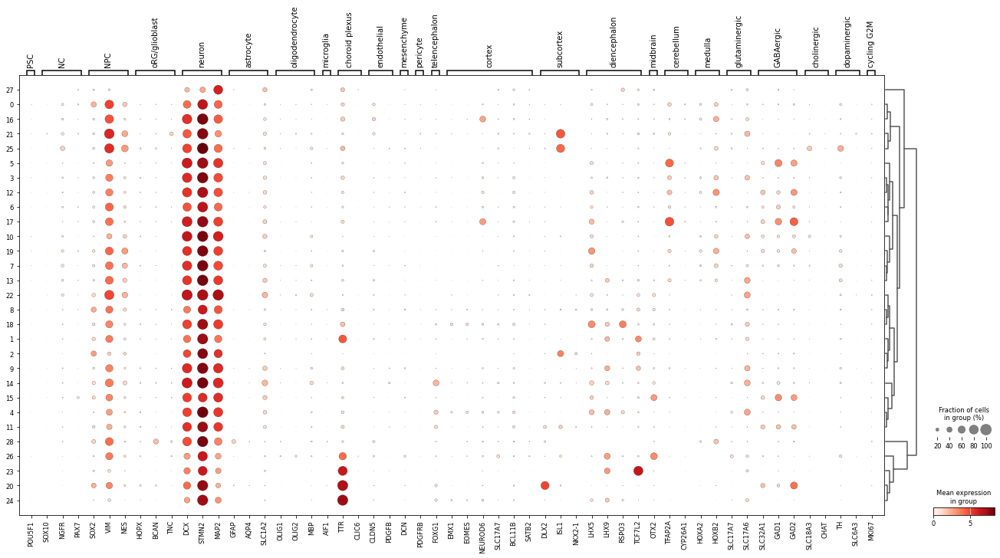

In [69]:
sc.pl.dotplot(adata_nontel, marker_genes_dict, 'leiden', dendrogram=True)

In [71]:
freq_region_cl = pd.concat([ adata_nontel.obs.snapseed_scpoli_region[adata_nontel.obs.leiden == x].value_counts(sort = False) for x in adata_nontel.obs.leiden.unique().sort_values() ], axis=1).set_axis(adata_nontel.obs.leiden.unique().sort_values(), axis=1)
freq_region_cl = freq_region_cl.loc[['cortex','subcortex','diencephalon','midbrain','hindbrain','unspecific'],:]
freq_region_cl

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
cortex,278,451,7,183,266,8,68,6,164,39,...,0,9,63,1,11,16,0,2,5,3
subcortex,10,127,206,47,207,51,167,48,92,179,...,1,623,1,0,12,5,6,3,1,1
diencephalon,3164,10475,8795,2856,4550,1548,2980,1492,6527,6396,...,299,168,1135,3623,1099,70,376,233,16,2
midbrain,758,497,392,182,6235,276,397,102,517,511,...,21,8,17,170,51,60,2,115,26,0
hindbrain,18542,2438,4907,9049,894,8829,7015,8661,2041,2562,...,5182,12,3128,418,31,4,1102,12,6,24
unspecific,294,3249,23,34,173,1,43,7,958,70,...,0,3925,14,3,2399,1496,44,573,6,0


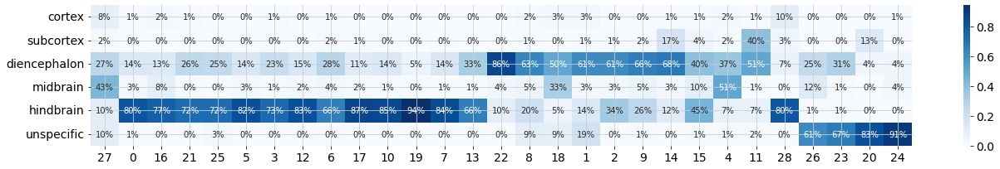

In [73]:
import seaborn as sns
from matplotlib.pyplot import rc_context

mat = freq_region_cl.loc[:,adata_nontel.uns['dendrogram_leiden']['categories_ordered']].apply(lambda x: x / np.sum(x), axis=0)
with rc_context({'figure.figsize': (22, 3)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

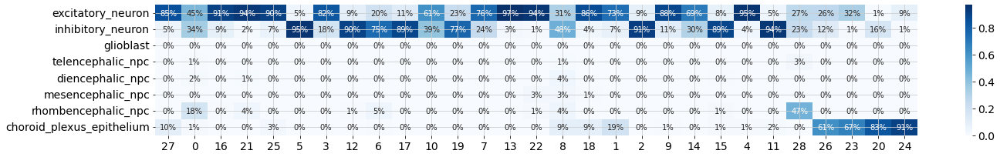

In [107]:
freq_ct_cl = pd.concat([ adata_nontel.obs.snapseed_scpoli_level_12[adata_nontel.obs['leiden'] == x].value_counts(sort = False) for x in adata_nontel.obs['leiden'].unique().sort_values() ], axis=1).set_axis(adata_nontel.obs['leiden'].unique().sort_values(), axis=1)
freq_ct_cl = freq_ct_cl.loc[['excitatory_neuron','inhibitory_neuron','glioblast','telencephalic_npc','diencephalic_npc','mesencephalic_npc','rhombencephalic_npc','choroid_plexus_epithelium'],:]

import seaborn as sns
from matplotlib.pyplot import rc_context

mat = freq_ct_cl.loc[:,adata_nontel.uns['dendrogram_leiden']['categories_ordered']].apply(lambda x: x / np.sum(x), axis=0)
with rc_context({'figure.figsize': (22, 3)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

### check the resolution=0.5 clusters

In [93]:
sc.tl.dendrogram(adata_nontel, 'leiden_0.5_scpoli_harmony', use_rep='X_pca_harmony')

categories: 0, 1, 2, etc.
var_group_labels: PSC, NC, NPC, etc.


/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


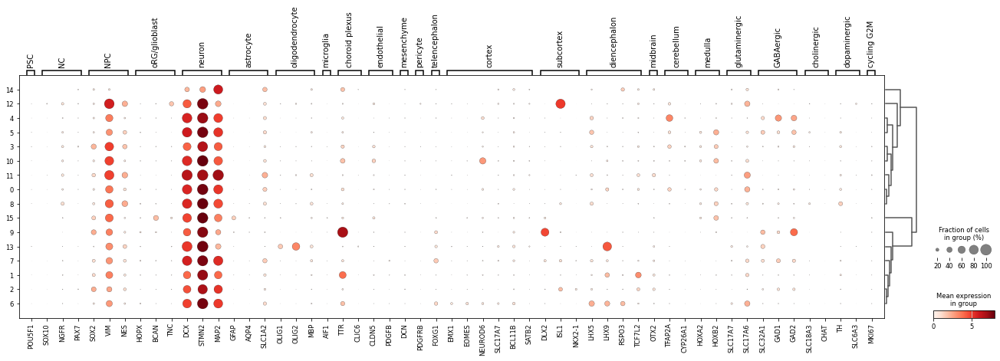

In [95]:
sc.pl.dotplot(adata_nontel, marker_genes_dict, 'leiden_0.5_scpoli_harmony', dendrogram=True)

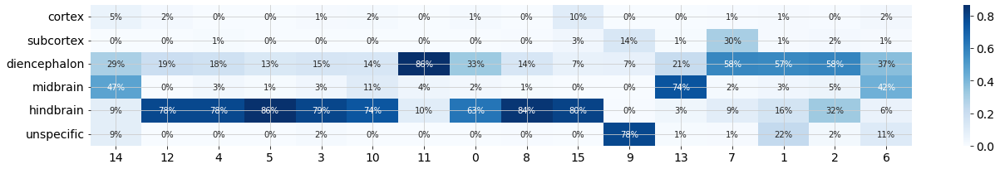

In [102]:
freq_region_cl = pd.concat([ adata_nontel.obs.snapseed_scpoli_region[adata_nontel.obs['leiden_0.5_scpoli_harmony'] == x].value_counts(sort = False) for x in adata_nontel.obs['leiden_0.5_scpoli_harmony'].unique().sort_values() ], axis=1).set_axis(adata_nontel.obs['leiden_0.5_scpoli_harmony'].unique().sort_values(), axis=1)
freq_region_cl = freq_region_cl.loc[['cortex','subcortex','diencephalon','midbrain','hindbrain','unspecific'],:]

import seaborn as sns
from matplotlib.pyplot import rc_context

mat = freq_region_cl.loc[:,adata_nontel.uns['dendrogram_leiden_0.5_scpoli_harmony']['categories_ordered']].apply(lambda x: x / np.sum(x), axis=0)
with rc_context({'figure.figsize': (22, 3)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

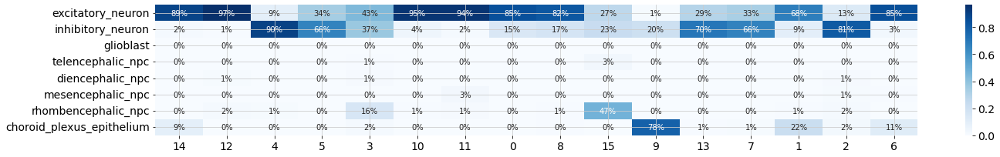

In [101]:
freq_ct_cl = pd.concat([ adata_nontel.obs.snapseed_scpoli_level_12[adata_nontel.obs['leiden_0.5_scpoli_harmony'] == x].value_counts(sort = False) for x in adata_nontel.obs['leiden_0.5_scpoli_harmony'].unique().sort_values() ], axis=1).set_axis(adata_nontel.obs['leiden_0.5_scpoli_harmony'].unique().sort_values(), axis=1)
freq_ct_cl = freq_ct_cl.loc[['excitatory_neuron','inhibitory_neuron','glioblast','telencephalic_npc','diencephalic_npc','mesencephalic_npc','rhombencephalic_npc','choroid_plexus_epithelium'],:]

import seaborn as sns
from matplotlib.pyplot import rc_context

mat = freq_ct_cl.loc[:,adata_nontel.uns['dendrogram_leiden_0.5_scpoli_harmony']['categories_ordered']].apply(lambda x: x / np.sum(x), axis=0)
with rc_context({'figure.figsize': (22, 3)}):
    sns.heatmap(mat, annot=True, cmap='Blues', fmt='.0%')

In [98]:
freq_ct_cl = pd.concat([ adata_nontel.obs.snapseed_scpoli_level_12[adata_nontel.obs.leiden == x].value_counts(sort = False) for x in adata_nontel.obs.leiden.unique().sort_values() ], axis=1).set_axis(adata_nontel.obs.leiden.unique().sort_values(), axis=1)
freq_ct_cl

,0,1,2,3,4,5,6,7,8,9,...,19,20,21,22,23,24,25,26,27,28
choroid_plexus_epithelium,293,3249,23,34,173,1,43,7,953,70,...,0,3925,14,3,2399,1496,44,573,6,0
diencephalic_npc,353,19,0,1,0,0,37,3,370,2,...,0,2,34,3,0,0,3,1,0,0
excitatory_neuron,10261,12594,1220,10135,11704,522,2081,7813,3226,8608,...,1263,50,4083,3983,1159,143,1379,247,51,8
glioblast,1,0,0,0,0,0,0,0,5,0,...,0,0,0,0,0,0,0,0,0,0
inhibitory_neuron,7933,1286,13086,2171,448,10189,8022,2487,4906,1063,...,4235,766,66,63,44,12,104,116,3,7
mesencephalic_npc,27,16,0,0,0,0,0,0,316,0,...,0,0,0,115,1,0,0,1,0,0
rhombencephalic_npc,4052,59,1,10,0,1,484,5,442,14,...,5,0,155,48,0,0,0,0,0,14
telencephalic_npc,126,14,0,0,0,0,3,1,81,0,...,0,2,6,0,0,0,0,0,0,1


### annotation based on resolution=0.5 clusters, plus modification based on res=1 and res=1.5 clusters

In [155]:
annot_cl = {'14': np.nan,
            '12': 'ExN (ISL1+ )',
            '4': 'InN (TFAP2A+)',
            '5': 'InN (HOXB2+)',
            '3': 'early N (HOXB2+)',
            '10': 'ExN (HOXB2/NEUROD6+)',
            '11': np.nan,
            '0': 'ExN (HOXB2+)',
            '8': np.nan,
            '15': np.nan,
            '9': 'InN (TTR+)',
            '13': 'InN (LHX9+)',
            '7': np.nan,
            '1': 'ExN (LHX9/TCF7L2+)',
            '2': 'InN (ISL1+)',
            '6': 'ExN (LHX9/LHX5+)'}
adata_nontel.obs['manual_neuron_subtype'] = np.array([annot_cl[x] for x in adata_nontel.obs['leiden_0.5_scpoli_harmony']])
adata_nontel.obs['manual_neuron_subtype'] = adata_nontel.obs['manual_neuron_subtype'].astype('category')

In [156]:
adata_nontel.obs['manual_neuron_subtype'][np.logical_and(adata_nontel.obs['leiden_0.5_scpoli_harmony']=='5', adata_nontel.obs['leiden_1.5_scpoli_harmony']=='21')] = 'ExN (HOXB2+)'
adata_nontel.obs['manual_neuron_subtype'] = adata_nontel.obs['manual_neuron_subtype'].cat.add_categories('ChN (HOXB2+)')
adata_nontel.obs['manual_neuron_subtype'][adata_nontel.obs['leiden'] == '25'] = 'ChN (HOXB2+)'

In [157]:
adata_nontel.obs['manual_neuron_subtype'][adata_nontel.obs['manual_neuron_subtype']=='nan'] = np.nan

/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/groups/treutlein/USERS/zhisong_he/anaconda3/envs/env_scarches/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/links/g

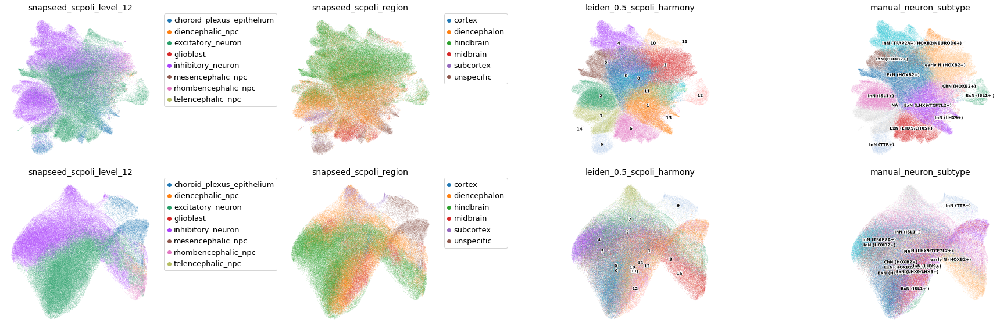

In [158]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(2,4,figsize=(24,8))
sc.pl.embedding(adata_nontel, ax = ax[0,0], basis='X_umap_scpoli_harmony', color=['snapseed_scpoli_level_12'], add_outline=False, frameon = False, show=False)
sc.pl.embedding(adata_nontel, ax = ax[0,1], basis='X_umap_scpoli_harmony', color=['snapseed_scpoli_region'], add_outline=False, frameon = False, show=False)
sc.pl.embedding(adata_nontel, ax = ax[0,2], basis='X_umap_scpoli_harmony', color=['leiden_0.5_scpoli_harmony'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
sc.pl.embedding(adata_nontel, ax = ax[0,3], basis='X_umap_scpoli_harmony', color=['manual_neuron_subtype'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
ax[0,0].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[0,1].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sc.pl.embedding(adata_nontel, ax = ax[1,0], basis='X_umap_scpoli', color=['snapseed_scpoli_level_12'], add_outline=False, frameon = False, show=False)
sc.pl.embedding(adata_nontel, ax = ax[1,1], basis='X_umap_scpoli', color=['snapseed_scpoli_region'], add_outline=False, frameon = False, show=False)
sc.pl.embedding(adata_nontel, ax = ax[1,2], basis='X_umap_scpoli', color=['leiden_0.5_scpoli_harmony'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
sc.pl.embedding(adata_nontel, ax = ax[1,3], basis='X_umap_scpoli', color=['manual_neuron_subtype'], add_outline=False, frameon = False, show=False, legend_loc='on data', legend_fontsize=7, legend_fontoutline=2)
ax[1,0].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
ax[1,1].legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()

In [159]:
adata_nontel.write_h5ad("data/phase3_final_0516/ZH_processed_nontelen_neurons.h5ad")